<a href="https://colab.research.google.com/github/Haroon-jay/dog-breed-identification/blob/main/dog-vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np



```
# This is formatted as code
```



In [ ]:
 #!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision 2"

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.17.0


In [ ]:
import tensorflow_hub as hub
print("GPU available") if tf.config.list_physical_devices("GPU") else print("GPU not available")

GPU available


# Turn images to tensor

In [ ]:
import pandas as pd

In [ ]:
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
#from IPython.display import Image
#Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames = ["drive/MyDrive/Dog Vision 2/train/" + fname + '.jpg' for fname in labels_csv["id"]]
len(filenames)

10222

In [ ]:
import os
if(len(os.listdir("drive/MyDrive/Dog Vision 2/train")) == len(filenames)):
  print("All images are present")

else:
  print("Some images are missing")

All images are present


In [ ]:
len(filenames)

10222

In [ ]:
len(os.listdir("drive/MyDrive/Dog Vision 2/train"))

10222

NameError: name 'Image' is not defined

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()

if(len(labels) == len(filenames)):
  print("All labels are present")

else:
  print("Some labels are missing")

All labels are present


In [ ]:
unique_breeds = (np.unique(labels))

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
X = filenames
y = boolean_labels
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2, random_state=42 )

In [ ]:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5]

['drive/MyDrive/Dog Vision 2/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision 2/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog Vision 2/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog Vision 2/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog Vision 2/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [ ]:
IMG_SIZE=224

In [ ]:
def process_img(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])
  return image

In [ ]:
def get_img_label(image_path,label):
  image = process_img(image_path)
  return image,label

In [ ]:
(get_img_label(X[42], y[42]))

(<tf.Tensor: shape=(128, 128, 3), dtype=float32, numpy=
 array([[[0.27929032, 0.4751063 , 0.2795834 ],
         [0.27585176, 0.46525738, 0.26177704],
         [0.3406097 , 0.52753276, 0.30271655],
         ...,
         [0.2751685 , 0.49869794, 0.29869792],
         [0.28818935, 0.51209253, 0.31603253],
         [0.29382864, 0.52127963, 0.33304432]],
 
        [[0.21575989, 0.41348663, 0.2655423 ],
         [0.29273564, 0.48136288, 0.32789788],
         [0.3189494 , 0.505239  , 0.33296594],
         ...,
         [0.25343138, 0.47303924, 0.28489584],
         [0.2582874 , 0.4802207 , 0.2991575 ],
         [0.27520525, 0.49873468, 0.32627755]],
 
        [[0.1963847 , 0.39246315, 0.28385404],
         [0.2122244 , 0.4047182 , 0.29629302],
         [0.22513789, 0.41602883, 0.29334742],
         ...,
         [0.22732845, 0.44489893, 0.27724636],
         [0.23500296, 0.45068926, 0.2900581 ],
         [0.25955886, 0.47524515, 0.32041976]],
 
        ...,
 
        [[0.13864364, 0.17785932

In [ ]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False,test_data=False):

  if(test_data):
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  elif(valid_data):
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_img_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch






In [ ]:
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches
Creating validation data batches


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [ ]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.8769258 , 0.8455533 , 0.6651611 ],
          [0.8815437 , 0.8462496 , 0.6776221 ],
          [0.8969143 , 0.8616202 , 0.69362295],
          ...,
          [0.9686275 , 0.41497943, 0.3800004 ],
          [0.97564787, 0.39406517, 0.3385679 ],
          [0.98230046, 0.39406517, 0.33524162]],
 
         [[0.8797882 , 0.8484157 , 0.66802347],
          [0.8765988 , 0.84130466, 0.67267716],
          [0.8758555 , 0.8405614 , 0.67256415],
          ...,
          [0.96599513, 0.4087862 , 0.37117475],
          [0.9762925 , 0.39384076, 0.338778  ],
          [0.98537296, 0.39141285, 0.3354517 ]],
 
         [[0.88764673, 0.8562742 , 0.675882  ],
          [0.881449  , 0.84615487, 0.67752737],
          [0.8650054 , 0.82971126, 0.661714  ],
          ...,
          [0.965555  , 0.39619234, 0.35252106],
          [0.9692228 , 0.37979692, 0.32417473],
          [0.9725491 , 0.37647063, 0.32156864]],
 
         ...,
 
         [[0.5005862 , 0.54764503, 0.46921366],
          [0.49901

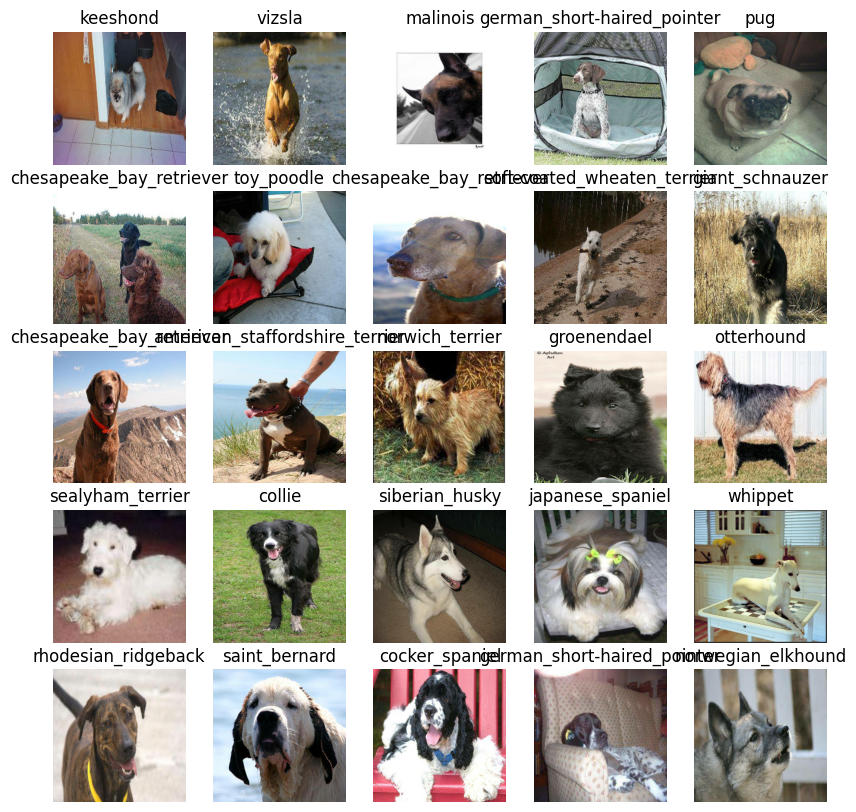

In [ ]:
show_25_images(train_images,train_labels)

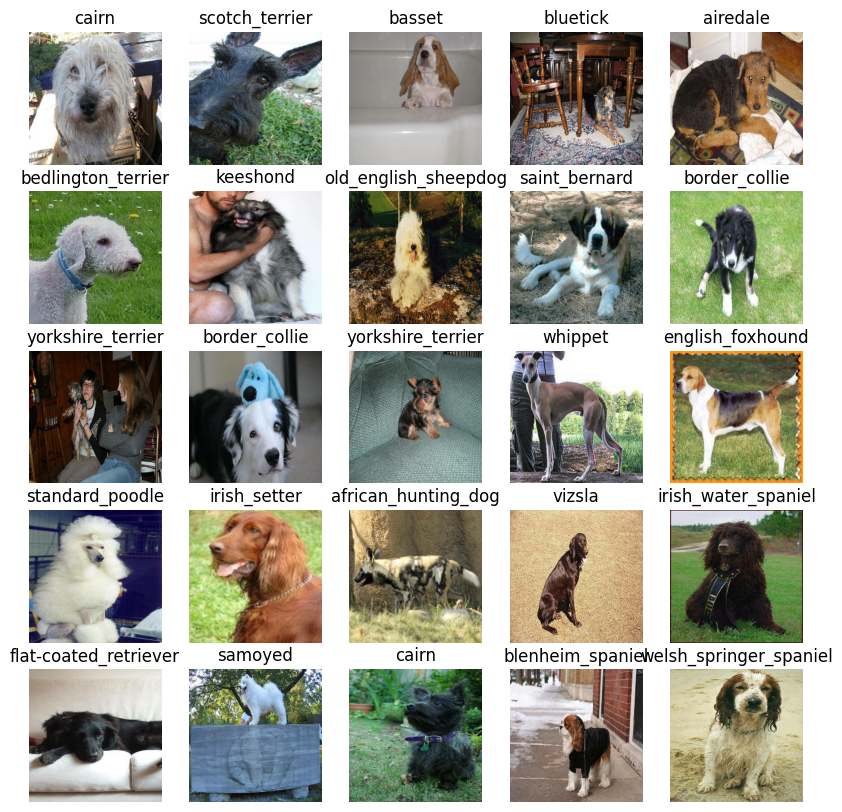

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"



In [ ]:
detector = hub.load(MODEL_URL)


import tf_keras
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)
  model = tf_keras.Sequential([
      hub.KerasLayer(model_url),
      tf_keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
  ])
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)
  # model.build(INPUT_SHAPE[1:])
  return model

In [ ]:
model=  create_model()


Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
%load_ext tensorboard

In [ ]:
print(123)

123


In [ ]:
import datetime

def create_tb_callback():
  log_dir = os.path.join("drive/MyDrive/Dog Vision 2/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(log_dir)

In [ ]:
early_stopping = tf_keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=3,
    verbose=1
)

In [ ]:
# Training a model
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
def train_model():
  model = create_model()
  tensorboard = create_tb_callback()
  model.fit(
      x=train_data,
      epochs=NUM_EPOCHS,
      validation_data=val_data,
      validation_freq=1,
      callbacks=[tensorboard,early_stopping]
  )
  return model



In [ ]:
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 11s 215ms/step - loss: 4.5347 - accuracy: 0.1225 - val_loss: 3.5845 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 4s 145ms/step - loss: 1.6276 - accuracy: 0.6737 - val_loss: 2.2384 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 176ms/step - loss: 0.5681 - accuracy: 0.9237 - val_loss: 1.7236 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 4s 147ms/step - loss: 0.2521 - accuracy: 0.9875 - val_loss: 1.5729 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 163ms/step - loss: 0.1461 - accuracy: 0.9987 - val_loss: 1.4802 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 5s 186ms/step - loss: 0.0993 - accuracy: 1.0000 - val_loss: 1.4388 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==================

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision\ 2/logs

Reusing TensorBoard on port 6006 (pid 5360), started 0:19:21 ago. (Use '!kill 5360' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# all imports
import numpy as np
import tensorflow as tf
import pandas as pd
import tf_keras
import matplotlib.pyplot as plt
import tensorflow_hub as hub
import os
import datetime

In [ ]:
model = tf_keras.models.load_model("drive/MyDrive/Dog Vision 2/saved_model.keras", custom_objects={'KerasLayer': hub.KerasLayer})

In [ ]:
# prompt: print hello world using rot13



LookupError: 'rot13' is not a text encoding; use codecs.encode() to handle arbitrary codecs

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions.shape

7/7 [==============================] - 3s 407ms/step


(200, 120)

In [ ]:
predictions[0].argmax()

59

In [ ]:
def print_label_and_pred(prediction_idx):
  print('Probability of pred:', predictions[prediction_idx].max())
  print("Label:", unique_breeds[y_val[prediction_idx].argmax()])
  print("Prediction:", unique_breeds[predictions[prediction_idx].argmax()])

In [ ]:
for i in range(10):
  print_label_and_pred(i)
  print('\n')

Probability of pred: 0.2814975
Label: cairn
Prediction: irish_wolfhound


Probability of pred: 0.3673534
Label: scotch_terrier
Prediction: scotch_terrier


Probability of pred: 0.75832415
Label: basset
Prediction: basset


Probability of pred: 0.56036675
Label: bluetick
Prediction: yorkshire_terrier


Probability of pred: 0.9669349
Label: airedale
Prediction: airedale


Probability of pred: 0.90619683
Label: bedlington_terrier
Prediction: bedlington_terrier


Probability of pred: 0.6263717
Label: keeshond
Prediction: keeshond


Probability of pred: 0.7684038
Label: old_english_sheepdog
Prediction: old_english_sheepdog


Probability of pred: 0.39388454
Label: saint_bernard
Prediction: saint_bernard


Probability of pred: 0.78180534
Label: border_collie
Prediction: collie




In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[prediction_probabilities.argmax()]

get_pred_label(predictions[4])


'airedale'

In [ ]:
images = []
labels = []

for image,label in val_data.unbatch().as_numpy_iterator():
  images.append(image)
  labels.append(unique_breeds[label.argmax()])

def unbatchify(data):
  images = []
  labels = []
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[label.argmax()])
  return images,labels


In [ ]:
images[0]

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  # if pred_label == true_label:
  #   color = "green"
  # else:
  #   color = "red"

  plt.title("{} {:2.0f}%".format(pred_label,
                                      np.max(pred_prob)*100,
                                      ),
                                      )

In [ ]:
val_labels


array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [ ]:
#model.save("drive/MyDrive/Dog Vision 2/saved_model.keras")

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_vals = pred_prob[top_10_pred_indexes]
  top_10_labels = unique_breeds[top_10_pred_indexes]
  # Plot image & remove ticks
  top_plot = plt.bar(np.arange(10), top_10_vals)
  plt.xticks(np.arange(10), labels=top_10_labels, rotation="vertical")

  true_label_val = unique_breeds[np.argmax(val_labels[n])]

  print(true_label_val, top_10_labels)
  if np.isin(true_label_val, top_10_labels):
    true_label_idx = np.where(top_10_labels == true_label_val)[0][0]
    print(true_label_idx)
    top_plot[true_label_idx].set_color("green")
  else:
    pass


  # if np.isin(true_label, top_10_labels):
  #   top_plot[np.argmax(top_10_labels == true_label)].set_color("green")
  # else:
  #   pass

In [ ]:
predictions[2].argsort()[-10:][::-1]
unique_breeds[predictions[2].argsort()[-10:][::-1]]


array(['basset', 'blenheim_spaniel', 'bloodhound', 'redbone', 'beagle',
       'walker_hound', 'basenji', 'saluki', 'pekinese', 'weimaraner'],
      dtype=object)

keeshond ['keeshond' 'norwegian_elkhound' 'japanese_spaniel' 'dandie_dinmont'
 'chihuahua' 'pomeranian' 'african_hunting_dog' 'malamute'
 'tibetan_mastiff' 'english_setter']
0


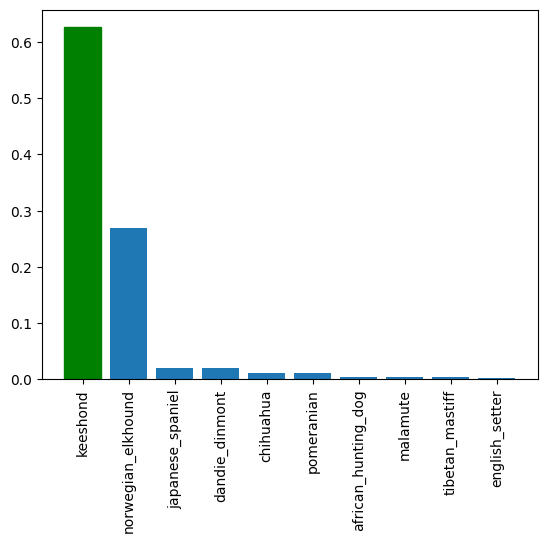

In [ ]:
plot_pred_conf(predictions, val_labels, n=6)

In [ ]:
unique_breeds[np.argmax(val_labels[3])]

'bluetick'

Exception ignored in: <function _xla_gc_callback at 0x7b8374f0f400>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 98, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


cairn ['irish_wolfhound' 'cairn' 'border_terrier' 'lhasa' 'standard_schnauzer'
 'dandie_dinmont' 'soft-coated_wheaten_terrier' 'shih-tzu'
 'tibetan_terrier' 'miniature_poodle']
1
scotch_terrier ['scotch_terrier' 'miniature_schnauzer' 'cairn' 'standard_schnauzer'
 'giant_schnauzer' 'irish_terrier' 'irish_wolfhound' 'mexican_hairless'
 'west_highland_white_terrier' 'groenendael']
0
basset ['basset' 'blenheim_spaniel' 'bloodhound' 'redbone' 'beagle'
 'walker_hound' 'basenji' 'saluki' 'pekinese' 'weimaraner']
0
bluetick ['yorkshire_terrier' 'border_terrier' 'tibetan_terrier' 'airedale'
 'standard_schnauzer' 'lhasa' 'beagle' 'bluetick' 'lakeland_terrier'
 'welsh_springer_spaniel']
7
airedale ['airedale' 'lakeland_terrier' 'irish_terrier' 'wire-haired_fox_terrier'
 'border_terrier' 'gordon_setter' 'german_shepherd'
 'chesapeake_bay_retriever' 'old_english_sheepdog' 'irish_setter']
0
bedlington_terrier ['bedlington_terrier' 'airedale' 'miniature_poodle' 'scottish_deerhound'
 'german_short-hai

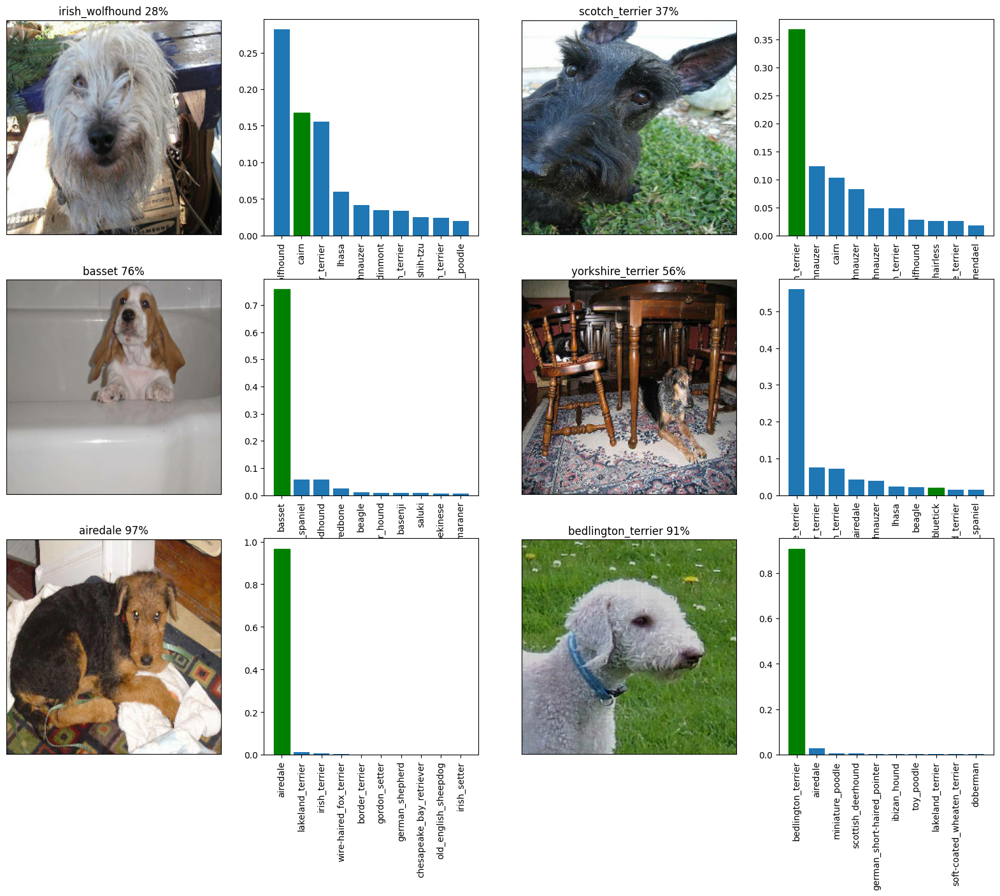

In [ ]:
i_multiplier = 0
num_rows= 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions, val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)

plt.show()

In [ ]:
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/MyDrive/Dog Vision 2/my_saved_models", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {path}")
  model.save(path)
  return path

In [ ]:
def load_model(path):
  print(f"Loading saved model from: {path}")
  model = tf_keras.models.load_model(path, custom_objects={'KerasLayer': hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="mobilenetv2-1000-images")

Saving model to: drive/MyDrive/Dog Vision 2/my_saved_models/20240805-172818-mobilenetv2-1000-images.h5


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision 2/my_saved_models/20240805-172818-mobilenetv2-1000-images.h5'

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X,y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()
import os

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
full_model_tensorboard = create_tb_callback()
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(
    monitor="accuracy",
    patience=3,
    verbose=1
)

In [ ]:
model_checkpoint_callback = tf_keras.callbacks.ModelCheckpoint(
    filepath= "drive/MyDrive/Dog Vision 2/my_saved_models/checkpointing-latest",
    monitor='accuracy',
    mode='max',
    save_best_only=True)

In [ ]:
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[full_model_tensorboard,full_model_early_stopping,
               model_checkpoint_callback
               ]
)
save_model(full_model, suffix="mobilenetv2-full-data")

Epoch 1/100
320/320 [==============================] - 55s 154ms/step - loss: 1.3525 - accuracy: 0.6671
Epoch 2/100
320/320 [==============================] - 47s 147ms/step - loss: 0.3998 - accuracy: 0.8830
Epoch 3/100
320/320 [==============================] - 52s 162ms/step - loss: 0.2383 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 47s 148ms/step - loss: 0.1553 - accuracy: 0.9625
Epoch 5/100
320/320 [==============================] - 48s 149ms/step - loss: 0.1078 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 48s 149ms/step - loss: 0.0779 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 50s 156ms/step - loss: 0.0587 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 48s 149ms/step - loss: 0.0462 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 48s 150ms/step - loss: 0.0380 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 49s 152m

NameError: name 'save_model' is not defined

In [ ]:
model = load_model("drive/MyDrive/Dog Vision 2/my_saved_models/checkpointing-latest")

Loading saved model from: drive/MyDrive/Dog Vision 2/my_saved_models/checkpointing-latest


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
test_path = "drive/MyDrive/Dog Vision 2/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision 2/test/e5a89b25873ada7aaafec0de1af86cb1.jpg',
 'drive/MyDrive/Dog Vision 2/test/e7340d1efa70bf6d6c134e1e150f9473.jpg',
 'drive/MyDrive/Dog Vision 2/test/e1ada9b155a5903bc6475255d012f681.jpg',
 'drive/MyDrive/Dog Vision 2/test/de93f567cf5830e982182435db086b93.jpg',
 'drive/MyDrive/Dog Vision 2/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 'drive/MyDrive/Dog Vision 2/test/dd98d4023806fdee7721b42db812f131.jpg',
 'drive/MyDrive/Dog Vision 2/test/dd9d222a481e6cbea922a1b601a55a38.jpg',
 'drive/MyDrive/Dog Vision 2/test/df0d6ba158287cb2b3ed6459a22d42ba.jpg',
 'drive/MyDrive/Dog Vision 2/test/dddb2b191e1b1de4867f6f5e81236312.jpg',
 'drive/MyDrive/Dog Vision 2/test/dcdffa00518844bd21499db49979f9c8.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
predictions = model.predict(test_data, verbose=1)

324/324 [==============================] - 1290s 4s/step


In [ ]:
np.savetxt("drive/MyDrive/Dog Vision 2/predictions.csv", predictions, delimiter=",")

In [ ]:
predictions.shape

(10357, 120)

In [ ]:
preds = np.loadtxt("drive/MyDrive/Dog Vision 2/predictions.csv", delimiter=",")

In [ ]:
preds.shape

(10357, 120)

In [ ]:
df = pd.DataFrame(columns = ["id"] + list(unique_breeds))

In [ ]:
df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
test_ids

['e5a89b25873ada7aaafec0de1af86cb1',
 'e7340d1efa70bf6d6c134e1e150f9473',
 'e1ada9b155a5903bc6475255d012f681',
 'de93f567cf5830e982182435db086b93',
 'e2f94ad185a2cfa2311c66c3e8bdba17',
 'dd98d4023806fdee7721b42db812f131',
 'dd9d222a481e6cbea922a1b601a55a38',
 'df0d6ba158287cb2b3ed6459a22d42ba',
 'dddb2b191e1b1de4867f6f5e81236312',
 'dcdffa00518844bd21499db49979f9c8',
 'df624595296500c98e3a1bf4d9ea917b',
 'e85d4e2707683df0e6387e19b67b873d',
 'ed574861296d0946948a4225e60e8d75',
 'f10241d199251db359961e814733efc5',
 'ed67681e7935d75f9ce011dbf8474fe4',
 'f1167eabf53759dad015f0abb813a451',
 'e8889cf9d7b2701a85be1c97661b9b26',
 'ede0dddd46a46f8f6467b7fbd1b4958a',
 'f30f7155fd94e7f0d3621d9cc9031e93',
 'ef59760870674327ca5d004bae427422',
 'e8899ab63ea8630d50f0b321cb4bf811',
 'f46c9b6ddea9aa7ff685604eec44f67a',
 'f45014f665123584d3588802ee020bce',
 'e91094730afaa4ade3d3041d96d57f3a',
 'e8c778896a73d0f6b4f88c564690c9db',
 'f16eed64196d24c423f0a68d7ebf287d',
 'f53c0a1ab2af3549a2ef5825d023b160',
 

In [ ]:
df["id"] = test_ids

In [ ]:
df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5a89b25873ada7aaafec0de1af86cb1,2.327984e-01,1.003062e-05,3.556781e-06,5.772062e-10,4.256921e-10,1.620477e-09,1.058617e-06,5.348228e-04,1.849324e-08,...,5.574584e-06,7.242196e-05,6.437828e-09,1.477075e-05,2.134133e-11,1.582456e-06,4.416334e-04,1.239058e-06,1.872624e-01,6.837112e-05
1,e7340d1efa70bf6d6c134e1e150f9473,2.012607e-09,1.006505e-06,1.083624e-09,1.275439e-06,6.102345e-08,6.298117e-05,2.297798e-10,1.421868e-09,1.234725e-09,...,2.446717e-09,1.410565e-10,8.510891e-09,6.731536e-06,6.398422e-08,9.065322e-10,3.847596e-10,1.418552e-05,1.447837e-11,4.112577e-09
2,e1ada9b155a5903bc6475255d012f681,1.282918e-06,3.711464e-09,8.597955e-12,5.849401e-08,1.869969e-08,2.016247e-11,3.638183e-07,6.611178e-09,2.293771e-08,...,7.274825e-08,5.407820e-08,4.599153e-08,4.741296e-06,1.934956e-08,2.142526e-10,5.935150e-08,1.487160e-09,1.256108e-03,7.467455e-06
3,de93f567cf5830e982182435db086b93,7.298698e-10,6.594119e-12,2.191317e-09,1.363893e-10,1.284485e-05,2.897752e-07,4.789750e-08,1.514608e-02,1.214489e-02,...,4.081034e-08,1.492678e-03,3.847668e-07,1.085811e-07,1.059169e-08,1.187587e-04,6.154358e-07,1.256960e-09,6.515362e-05,4.242916e-08
4,e2f94ad185a2cfa2311c66c3e8bdba17,1.603637e-05,1.153437e-07,1.629664e-09,4.054280e-10,1.828831e-09,4.048745e-11,5.033984e-09,4.270023e-09,4.867944e-08,...,7.923449e-10,8.588536e-08,2.447742e-08,3.927435e-07,8.184873e-10,4.470337e-10,1.177816e-07,5.521474e-11,1.046764e-05,1.433680e-06


In [ ]:
df[list(unique_breeds)] = preds

In [ ]:
df.to_csv("drive/MyDrive/Dog Vision 2/submission_mobilenetV2_full_model.csv", index=False)

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',
